# <a href="https://miptstats.github.io/courses/ad_fivt.html">Введение в анализ данных</a>
## Домашнее задание 6. Линейная регрессия.


**Правила, <font color="red">прочитайте внимательно</font>:**




* Выполненную работу нужно отправить телеграм-боту `@miptstats_ds23_bot`. Для начала работы с ботом каждый раз отправляйте `/start`. Дождитесь подтверждения от бота, что он принял файл. Если подтверждения нет, то что-то не так. **Работы, присланные иным способом, не принимаются.**
* Дедлайн см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Прислать нужно **ноутбук в формате `ipynb`**. Если вы строите интерактивные графики, их стоит прислать в формате html.
* Следите за размером файлов. **Бот не может принимать файлы весом более 20 Мб.** Если файл получается больше, заранее разделите его на несколько.
* Выполнять задание необходимо полностью самостоятельно. **При обнаружении списывания все участники списывания будут сдавать устный зачет.**
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Кроме того, публикация решения в открытом доступе может быть приравнена к предоставлении возможности списать.
* Для выполнения задания используйте этот ноутбук в качестве основы, ничего не удаляя из него. Можно добавлять необходимое количество ячеек.
* Комментарии к решению пишите в markdown-ячейках.
* Выполнение задания (ход решения, выводы и пр.) должно быть осуществлено на русском языке.
* Если код будет не понятен проверяющему, оценка может быть снижена.
* Никакой код из данного задания при проверке запускаться не будет. *Если код студента не выполнен, недописан и т.д., то он не оценивается.*
* **Код из рассказанных на занятиях ноутбуков** можно использовать без ограничений.


**Правила оформления теоретических задач:**

* Решения необходимо прислать одним из следующих способов:
  * фотографией в правильной ориентации, где все четко видно, а почерк разборчив,
    * отправив ее как файл боту вместе с ноутбуком
    * *или* вставив ее в ноутбук посредством `Edit -> Insert Image` при редактировании markdown-ячейки (<font color="red">фото, вставленные ссылкой, не принимаются</font>);
  * в виде $LaTeX$ в markdown-ячейках.
* Решения не проверяются, если какое-то требование не выполнено. Особенно внимательно все проверьте в случае выбора второго пункта (вставки фото в ноутбук). **<font color="red">Неправильно вставленные фотографии могут не передаться при отправке.</font>** Для проверки попробуйте переместить `ipynb` в другую папку и открыть его там.
* **В решениях поясняйте, чем вы пользуетесь**, хотя бы кратко. Например, если пользуетесь независимостью, то достаточно подписи вида "*X и Y незав.*"
* Решение, в котором есть только ответ, и отсутствуют вычисления, оценивается в 0 баллов.



**Баллы за задание:**

<b><font color="blue">Легкая часть</font></b> (достаточно на "хор"):
* Задача 1 &mdash; 40 баллов
* Задача 2 &mdash; 80 баллов

<b><font color="orange">Сложная часть</font></b> (необходимо на "отл"):
* Задача 3 &mdash; 50 баллов
* Задача 4 &mdash; 60 баллов
* Задача 5 &mdash; 30 баллов


In [1]:
# Bot check

# HW_ID: fpmi_ad6
# Бот проверит этот ID и предупредит, если случайно сдать что-то не то.

# Status: final
# Перед отправкой в финальном решении удали "not" в строчке выше.
# Так бот проверит, что ты отправляешь финальную версию, а не промежуточную.
# Никакие значения в этой ячейке не влияют на факт сдачи работы.

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style='whitegrid', font_scale=1.3, palette='Set2')
%matplotlib inline

При решении задания используйте `sklearn`. Пропишите сюда необходимые импорты

In [3]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn import metrics

### <font color="blue"><i>Легкая часть</i></font>

### Задача 1.

Рассмотрим одномерную линейную регрессию без свободного параметра $y(x) = \theta x$, где $x\in \mathbb{R}$ и $\theta \in \mathbb{R}$. Предполагаем, что данные получены по правилу
$$Y_i = \theta x_i + \varepsilon_i,$$
где $i \in \{1, ..., n\}$, числа $x_i \in \mathbb{R}$ неслучайны, а $\varepsilon_i$ &mdash; случайные ошибки.

**1.** Посчитайте оценку $\widehat{\theta}$ методом наименьших квадратов по явной формуле.

**2.** Выпишите формулы градиентного спуска (GD) и стохастического градиентного спуска (SGD) для поиска $\widehat{\theta}$. Не забудьте указать, как в SGD математически определяется батч (набор объектов на каждой итерации).

**3.** Пусть $\mathsf{E}\varepsilon_i = 0$, а $x \in \mathbb{R}$ &mdash; новый объект. Посчитайте $\mathsf{E}\widehat{\theta}$ и $\mathsf{E}\widehat{y}(x)$, где $\widehat{y}(x) = \widehat{\theta} x$.

**4.** Пусть $\mathsf{E}\varepsilon_i = 0$ и $\mathsf{D}\varepsilon_i = \sigma^2$, причем все $\varepsilon_i$ независимы, а $x \in \mathbb{R}$ &mdash; новый объект. Посчитайте $\mathsf{D}\widehat{\theta}$ и $\mathsf{D}\widehat{y}(x)$, где $\widehat{y}(x) = \widehat{\theta} x$. 

**5.** При каких условиях дисперсии в пункте 4 конечны? Подумайте и ответьте на вопрос, как ведет себя дисперсия предсказания в многомерном случае если матрица $X^T X$ близка к вырожденной.



*Замечания.* 
1. В пунктах 3-5 речь идет о $\widehat{\theta}$, которая является *решением* задачи метода наименьших квадратов. Поэтому пользуйтесь явной формулой этого решения, а не формулами методов вычисления решения.
2. В ответе во всех пунктах могут оставаться суммы $n$ слагаемых, но не должно быть операций с векторами или матрицами.
3. **Прочитай требования к формату решения в правилах сдачи задания.**

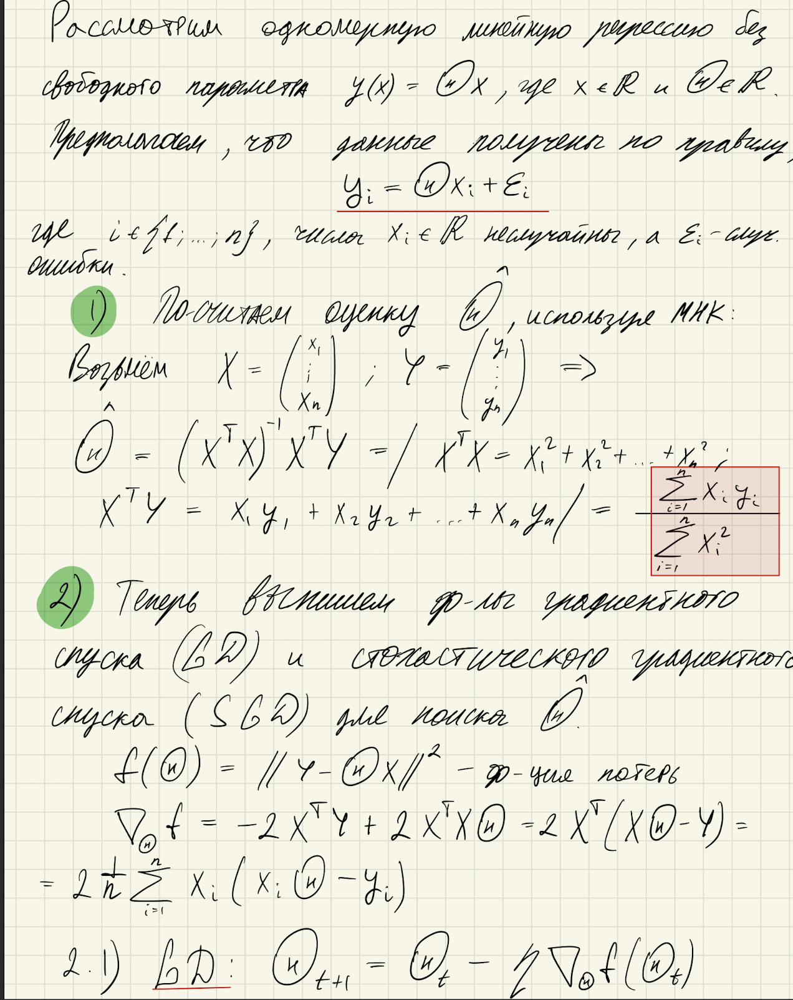

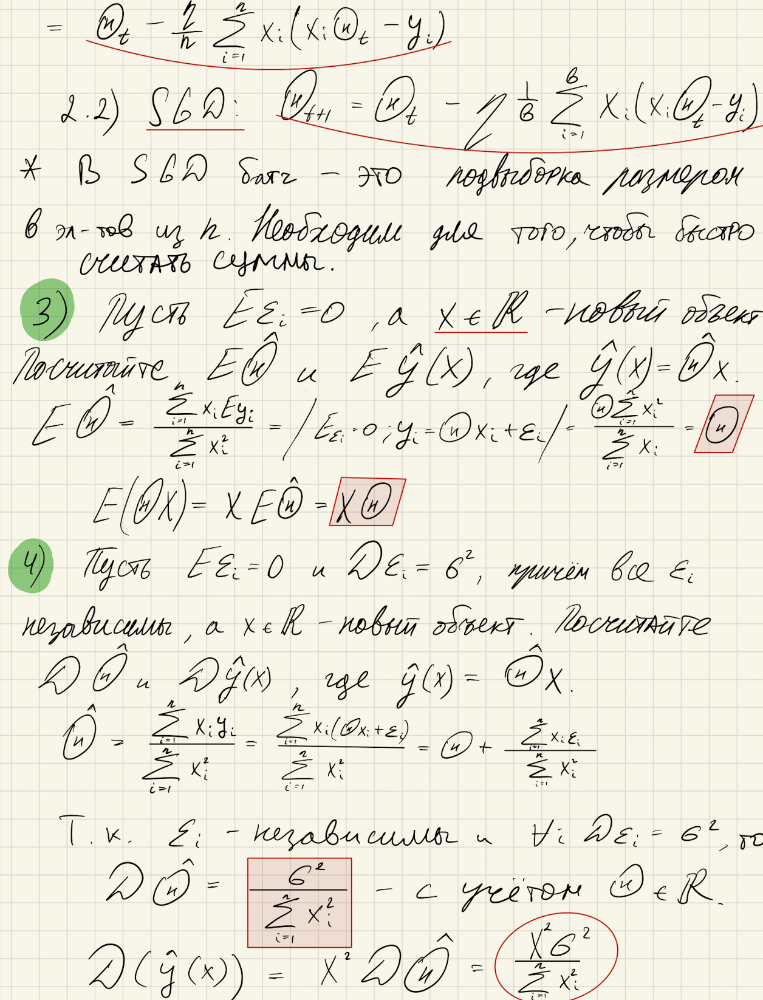

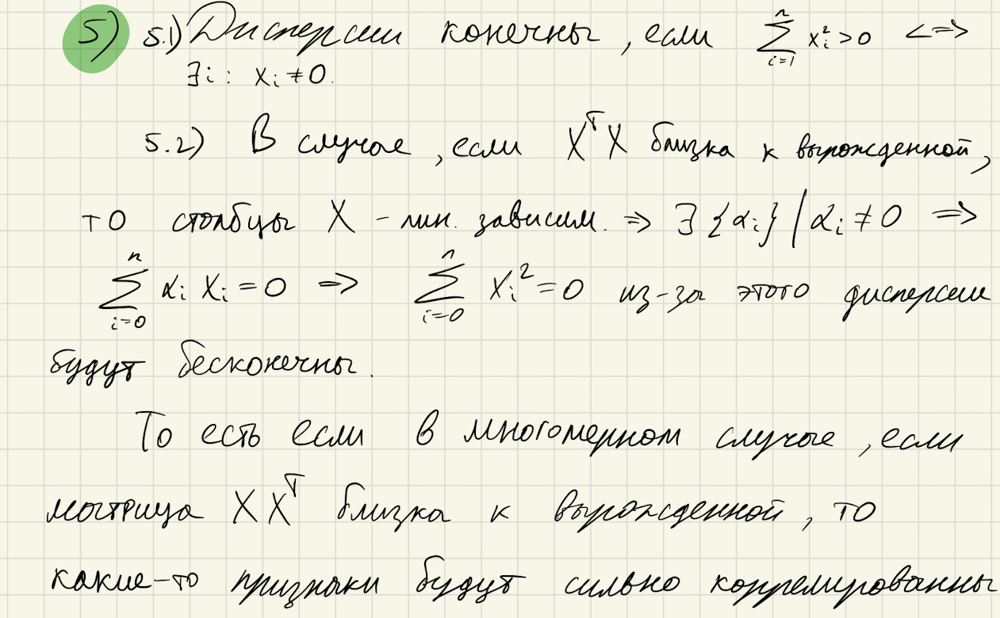

---
### Задача 2.

Скоро лето &mdash; идеальное время года для путешествий и прогулок на велосипедах. В крупных городах обычно развиты сети проката велосипедов, предоставляющие удобный сервис. Одной из важных задач таких компаний является прогнозирование количества арендованных велосипедов в зависимости от времени года и погодных условий.

Рассмотрим датасет <a target="_blank" href="https://archive.ics.uci.edu/ml/datasets/Bike+Sharing+Dataset">Bike Sharing Dataset</a> от компании <a target="_blank" href="https://www.capitalbikeshare.com/">Capital Bikeshare</a>, располагающей автоматизированными пунктами проката велосипедов. В датасете по дням записаны календарная информация и погодные условия, а также число прокатов в этот день. Цель &mdash; предсказать количество арендованных велосипедов по остальным характеристикам.

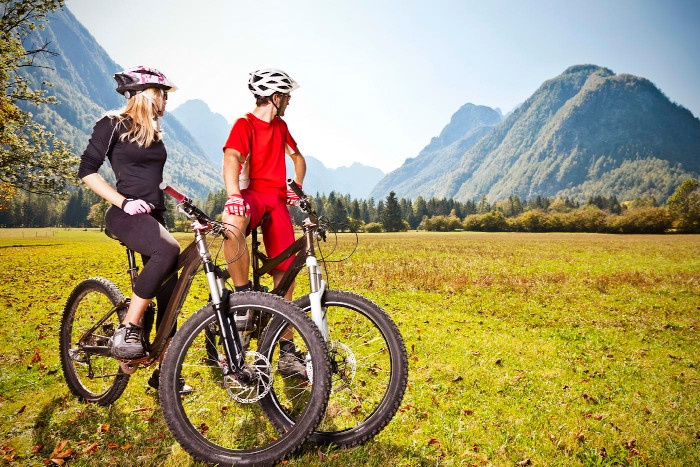

Будем работать только со следующими признаками:
* `season`: время года: 1 &mdash; зима, 2 &mdash; весна, 3 &mdash; лето, 4 &mdash; осень;
* `mnth`: месяц от 1 до 12;
* `holiday`: является ли текущий день праздничным;
* `weekday`: день недели от 0 до 6;
* `workingday`: является ли текущий день рабочим или выходным;
* `weathersit`: оценка благоприятности погоды от 1 (чистый, ясный день) до 4 (ливень, туман);
* `temp`: температура в Цельсиях;
* `atemp`: температура по ощущениям в Цельсиях;
* `hum`: влажность воздуха;
* `windspeed`: скорость ветра;
* `cnt`: количество арендованных велосипедов в текущий день.

Перед выполнением задания обязательно посмотрите <a href="https://miptstats.github.io/courses/ad_fivt/linreg_sklearn.html">ноутбук</a> с занятия по линейной регрессии.

---

Скачайте данные, загрузите их с помощью `pandas` и разделите на обучающую и тестовую части в соотношении 4:1. Далее всю аналитику необходимо проводить только на обучающей части данных.

In [4]:
data_set = pd.read_csv("day.csv")
data_set

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985
1,2,2011-01-02,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801
2,3,2011-01-03,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349
3,4,2011-01-04,1,0,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562
4,5,2011-01-05,1,0,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,727,2012-12-27,1,1,12,0,4,1,2,0.254167,0.226642,0.652917,0.350133,247,1867,2114
727,728,2012-12-28,1,1,12,0,5,1,2,0.253333,0.255046,0.590000,0.155471,644,2451,3095
728,729,2012-12-29,1,1,12,0,6,0,2,0.253333,0.242400,0.752917,0.124383,159,1182,1341
729,730,2012-12-30,1,1,12,0,0,0,1,0.255833,0.231700,0.483333,0.350754,364,1432,1796


Теперь выберем только те признаки, которые представлены в условии.

In [5]:
data = data_set[['season', 'mnth', 'holiday', 'weekday', 'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed', 'cnt']]
data

,season,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt
0,1,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,985
1,1,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,801
2,1,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,1349
3,1,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,1562
4,1,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,1600
...,...,...,...,...,...,...,...,...,...,...,...
726,1,12,0,4,1,2,0.254167,0.226642,0.652917,0.350133,2114
727,1,12,0,5,1,2,0.253333,0.255046,0.590000,0.155471,3095
728,1,12,0,6,0,2,0.253333,0.242400,0.752917,0.124383,1341
729,1,12,0,0,0,1,0.255833,0.231700,0.483333,0.350754,1796


Разделим данные на обучающие и тестовые.

In [6]:
train, test = train_test_split(data, test_size=0.2)
train.shape, test.shape

((584, 11), (147, 11))

#### 1. Визуальный анализ

Посмотрите по графикам, как *целевой признак зависит от остальных* и поймите характер этой зависимости. Старайтесь строит информативные графики.

Какие признаки категориальные, а какие &mdash; вещественные? Учтите это при построении информативных графиков.

Выделим категории признаков

In [7]:
categorial_features = ['season', 'mnth', 'holiday', 'weekday', 'workingday', 'weathersit'] # категориальные признаки
real_features = ['temp', 'atemp', 'hum', 'windspeed'] # вещественные признаки
target_feature = 'cnt' # целевой признак

Теперь построим необходимые графики.

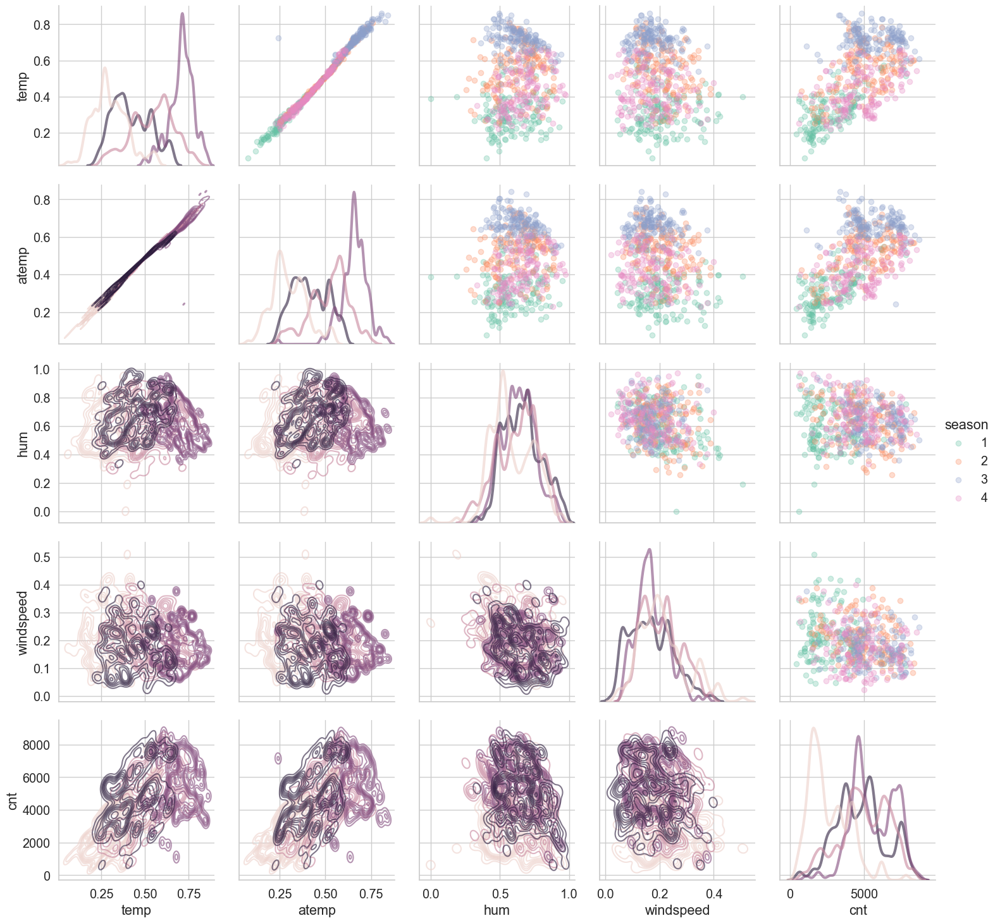

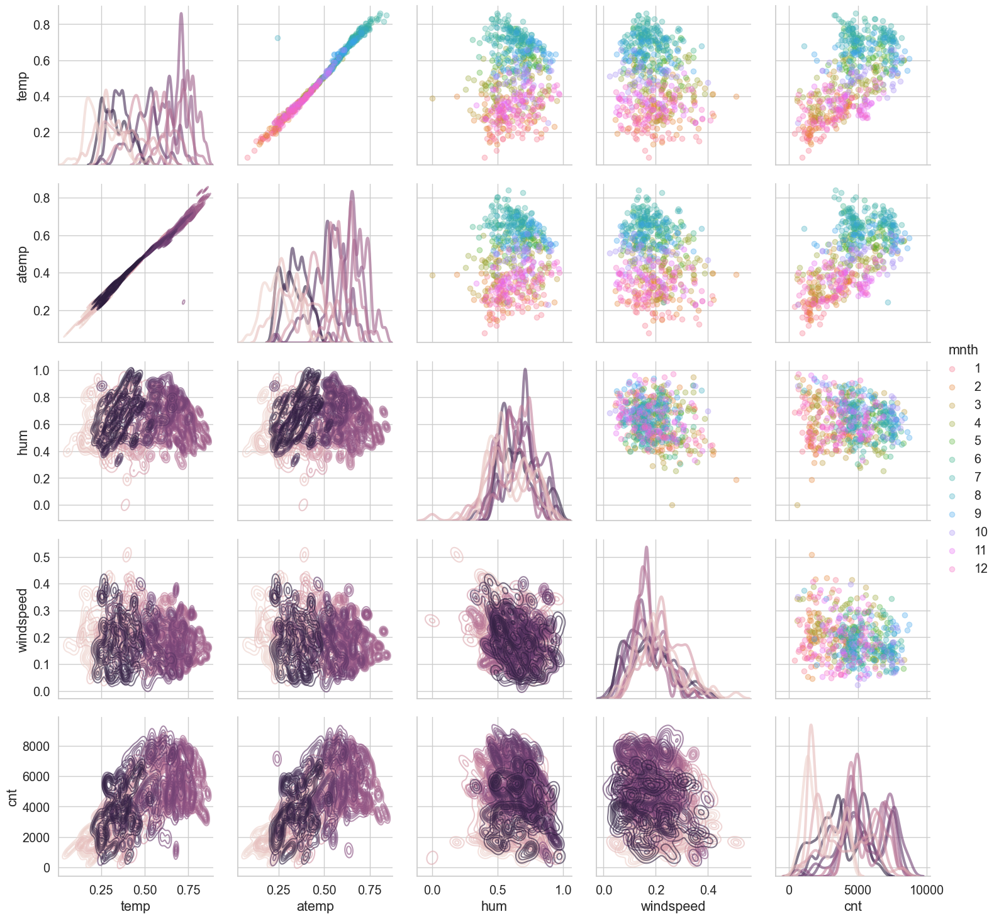

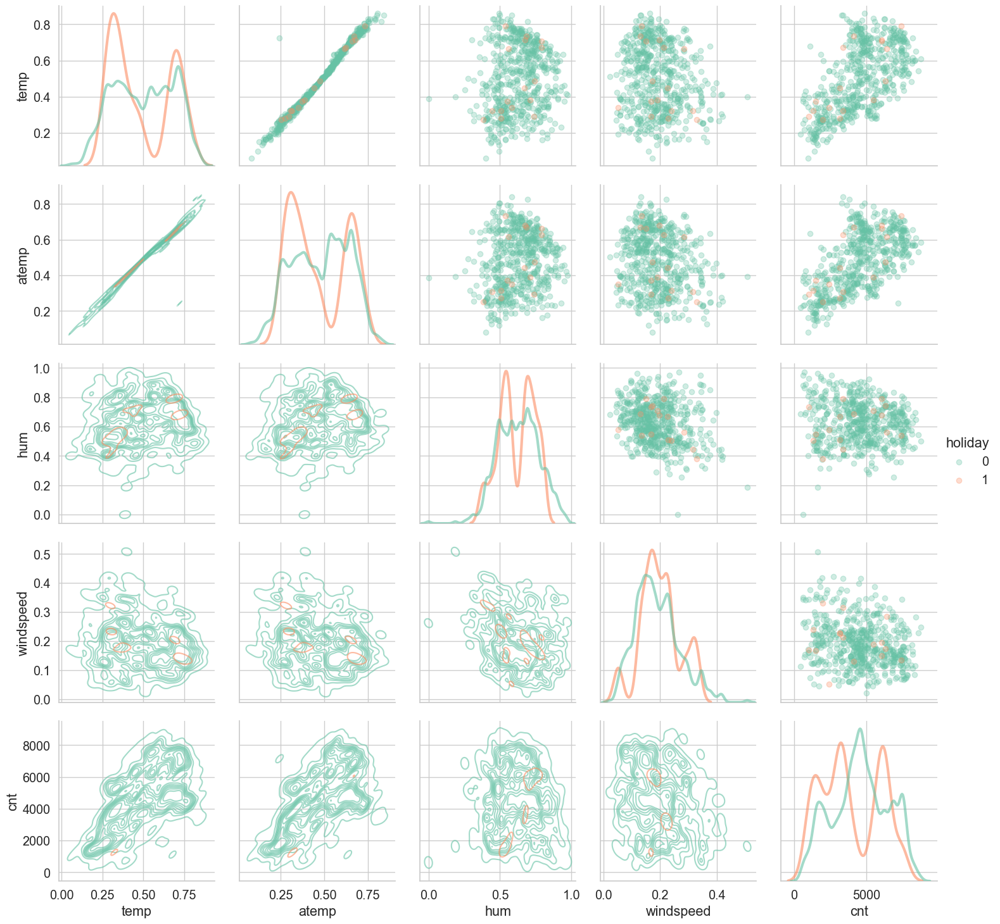

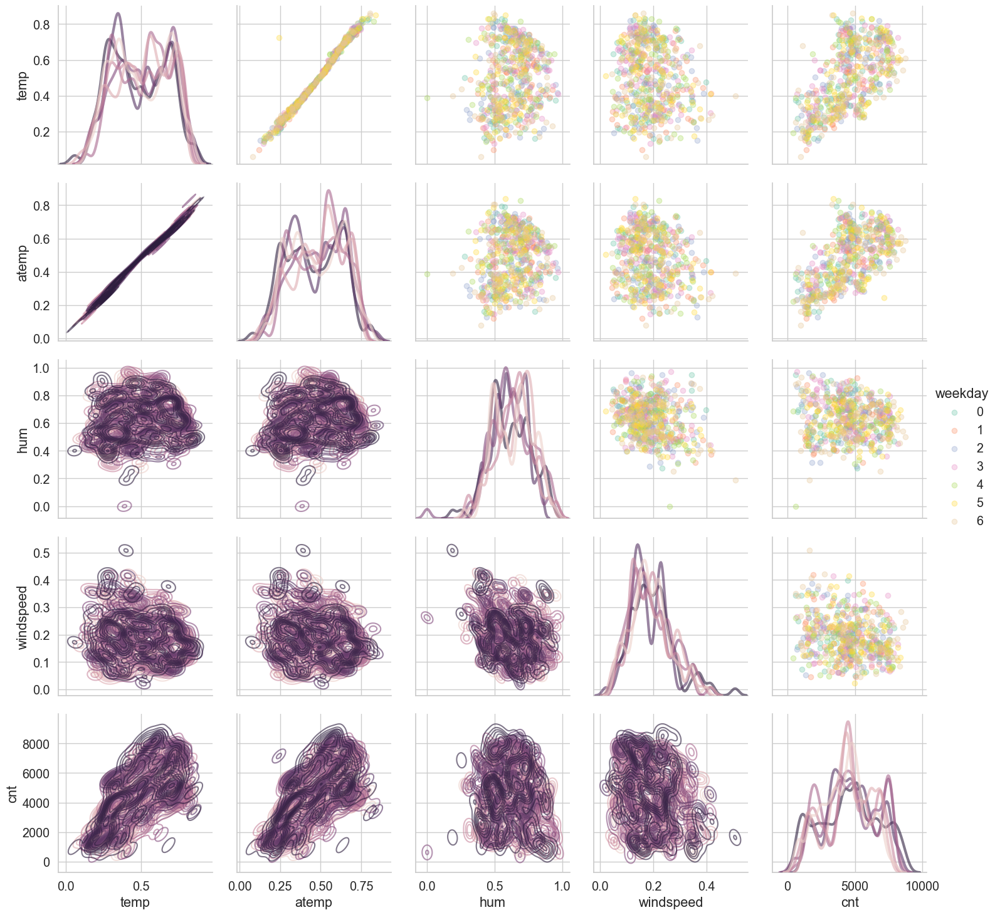

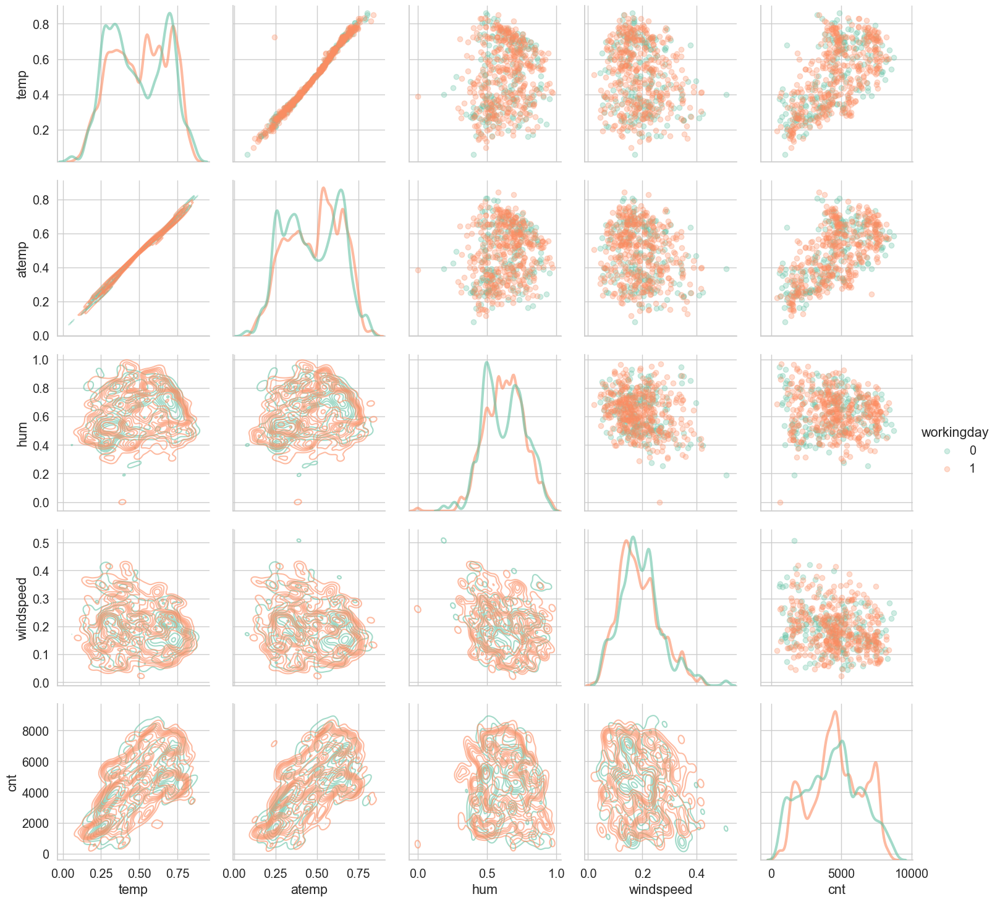

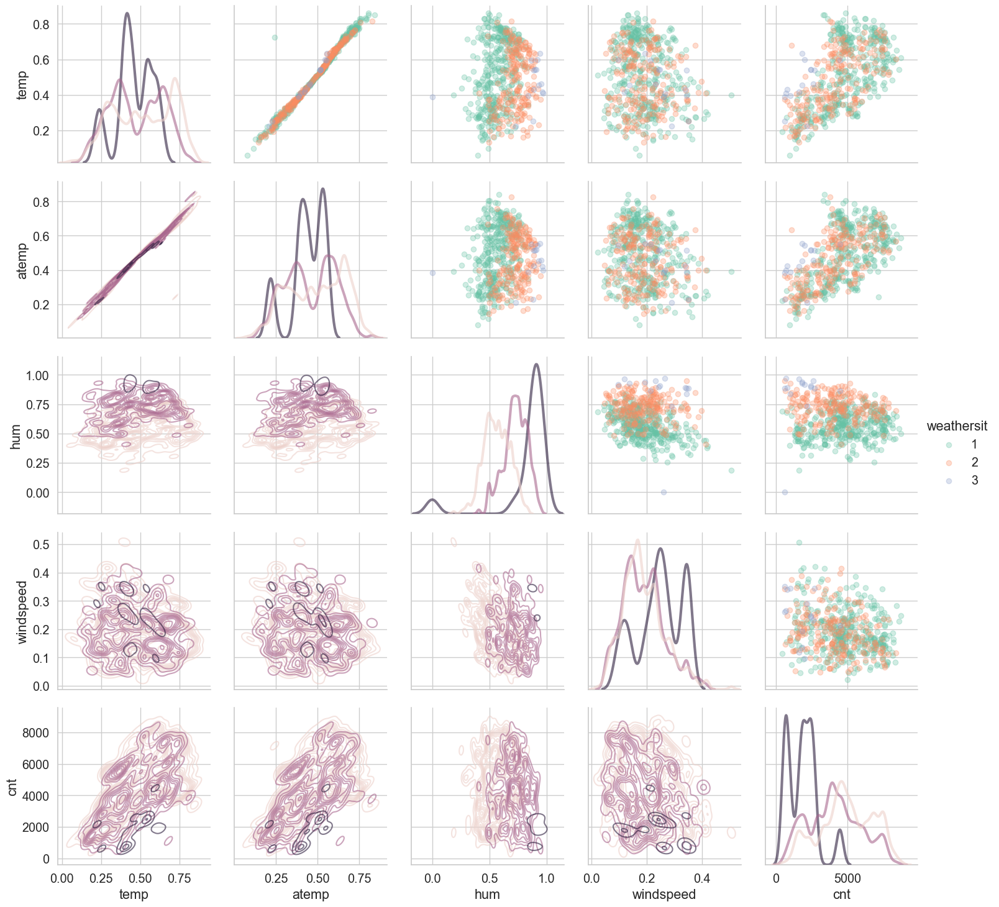

In [8]:
for hue in categorial_features:
    g = sns.PairGrid(train[['temp', 'atemp', 'hum', 'windspeed', 'cnt', hue]], 
                     hue=hue, diag_sharey=False, height=3)
    
    g.map_lower(sns.kdeplot, alpha=0.6, bw_adjust=0.4)
    g.map_upper(plt.scatter, alpha=0.3)
    g.map_diag(sns.kdeplot, lw=3, alpha=0.6, 
               common_norm=False, bw_adjust=0.4)  # каждая плотность по отдельности должна давать 1 при интегрировании
    
    g.add_legend()

Сделайте выводы по графикам. В частности, ответьте на следующие вопросы.
* Есть ли в данных явные выбросы, то есть точки, далеко находящиеся от основной массы точек?
* Стоит ли рассматривать какие-либо нелинейные функции от признаков? Не стоит придумывать сложные функции, достаточно рассмотреть $x^2$, $\log x$ и $I\{x > c\}$.



**Выводы по графикам:**

В первую очередь стоит отметить, что сезон и месяц напрямую влияют на количество арендованных велосипедов. То есть летом - наибольшее количество аренд, зимой - наименьшее. Также чем больше ощущаемая температура atemp, тем больше количество арендованных велосипедов. Прямопропорциональная зависимость чётко отслеживается на графиках. Далее признаки atemp и temp почти не отличаются. То есть они являюстя зависимыми признаками.

Исходя из просмотренных графиков, выбросы составляют примерно 1%. Данные нормализованы и в окрестности 0 графики квадратичной, логирифмической функции и индикатор функции не очень презентабельны.

#### 2. Подготовка данных

Опишите по шагам процедуру предобработки данных, которая будет включать работу с выбросами, преобразования вещественных и категориальных признаков, возможно, что-то еще.

**Процедура предобработки данных:**

**a)** Исключим выбросы для вещественных признаков

Реализуйте данную процедуру.

In [9]:
for col in real_features:
    emissions_left = train[col].quantile(0.01)
    emissions_right = train[col].quantile(0.99)
    train = train[(train[col] < emissions_right) & (train[col] > emissions_left)]
    
    emissions_left = test[col].quantile(0.01)
    emissions_right  = test[col].quantile(0.99)
    test = test[(test[col] < emissions_right) & (test[col] > emissions_left)]
print("Размер обучающей выборки: ", train.shape)
print("Размер тестовой выборки: ", test.shape)

Размер обучающей выборки:  (536, 11)
Размер тестовой выборки:  (131, 11)


#### 3. Обучение модели и ее анализ

Обучите линейную регрессию из `sklearn` на полученных данных и посмотрите на полученные оценки коэффициентов (в т.ч. свободный коэффициент).

Далее закодируем категориальные признаки.

In [10]:
encoder = OneHotEncoder(drop='first', sparse=False)  # объявляем модель
train_cat = encoder.fit_transform(train[categorial_features])  # обучаем и кодируем
train_cat

array([[1., 0., 0., ..., 0., 1., 0.],
       [0., 1., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 1., 1., 0.],
       [0., 0., 1., ..., 1., 0., 0.]])

Соединим вместе вещественные признаки и закодированные категориальные

In [11]:
X_train = np.hstack([train[real_features], train_cat])
X_train.shape

(536, 28)

Теперь обучим модель линейной регрессии по нашим данным.

In [12]:
model = LinearRegression(fit_intercept=True)  # объявляем модель
model.fit(X_train, train[target_feature])  # обучаем

print("Полученные оценки коэффициентов: ")
for num in model.coef_:
    print(round(num, 3), end=" ")

print()
print("Свободный коэфффицент: ", round(model.intercept_, 3))


Полученные оценки коэффициентов: 
6241.868 1501.45 -3906.667 -4044.42 794.834 370.201 1311.813 131.489 244.745 -81.135 67.147 -496.709 -637.594 -313.609 693.882 344.11 -22.543 41.79 -451.188 -14.913 -162.097 -16.704 67.164 82.791 606.493 407.428 -82.474 -1423.885 
Свободный коэфффицент:  3123.316


Посчитайте ошибку предсказания на тестовой выборке по метрикам RMSE, MAE, MAPE. Подробнее можно почитать в <a href="https://miptstats.github.io/courses/ad_fivt/linreg_sklearn.html#3.-Тестирование-и-оценка-качества">ноутбуке</a> с занятия.

*Замечание.* Если в тестовой части тоже есть "большие" выбросы, их стоит убрать. Наша модель не должна пытаться их предсказать, но в то же время выбросы вносят существенный вклад в значение метрики. 

Кодируем **тестовые** категориальные признаки и соединяем их с вещественными.

In [13]:
test_cat = encoder.transform(test[categorial_features])
X_test = np.hstack([test[real_features], test_cat])

Выполним предсказание построенной ранее моделью.

In [14]:
test_preds = model.predict(X_test)

Сперва воспользуемся метрикой RMSE.

In [15]:
metrics.mean_squared_error(test[target_feature], test_preds) ** 0.5

1242.6988108103822

Далее воспользуемся метрикой MAE.

In [16]:
metrics.mean_absolute_error(test[target_feature], test_preds)

1070.6951681281869

И наконец - метрикой MAPE.

In [17]:
def mean_absolute_percentage_error(y_true, y_pred):
    return 100 * (np.abs(y_true - y_pred) / y_true).mean()

In [18]:
print("ошибка в процентах: ", mean_absolute_percentage_error(test[target_feature], test_preds))

ошибка в процентах:  110.88698042157623


Попробуйте посчитать оценку коэффициентов с помощью формулы, полученной на занятии. Не забудьте про константный признак. В чем заключается проблема?

*Подсказка.* Подумайте о зависимостях между признаками.

Оценка коэффицентов с помощью формулы из задачи №1.

In [19]:
koef_num = (np.linalg.inv(X_train.transpose() @ X_train)) @ X_train.transpose() @ train[target_feature]

print("Полученные оценки коэффициентов: ")
for num in koef_num:
    print(round(num, 3), end=" ")

Полученные оценки коэффициентов: 
16111754.892 -14923972.358 156732.24 -1897128.623 72282.786 -227989.423 74861.027 -20950.858 -367703.133 -479895.481 -936101.464 -1159684.445 -1118071.153 -1238319.962 -827552.106 -576441.374 -240324.707 -265119.897 -312737.656 277559.457 238579.018 170748.311 239326.027 219953.634 956.936 -247594.201 -377.862 -2212.145 

Коэффиценты в двух методах подсчёта сильно отличаются из-за того, что некоторые наши признаки зависимы. И матрица значений признаков становится вырожденной, что приводит к большому росту итоговых коэффицентов.

In [20]:
print("RMSE: ", np.sqrt(((test[target_feature] - X_test @ koef_num)**2).mean()))

RMSE:  278411.2105638471


In [21]:
print("ошибка в процентах: ", mean_absolute_percentage_error(test[target_feature], X_test @ koef_num))

ошибка в процентах:  23343.577273060728


Исправьте эту проблему, посчитайте оценки коэффициентов, а также ошибку предсказания.

Уберём зависимые признаки из таблицы, учитывая выводы по графикам.

А именно:

1) **temp**, так как признак сильно зависит от **atemp**

2) **mnth**, так как признак зависит от **season**

3) **workingday**, так как это признак - линейная комбинация **weekday** и **holiday**

In [22]:
categorial_features = ['season', 'holiday', 'weekday', 'weathersit'] 
real_features = ['atemp', 'hum', 'windspeed']
target_feature = 'cnt'

Проделаем все те же действия, чтобы закодировать категориальные признаки. А затем опять посчитаем оценки коэффицентов с помощью формулы из задачи №1.

In [23]:
encoder = OneHotEncoder(drop='first', sparse=False)  # объявляем модель
train_cat = encoder.fit_transform(train[categorial_features])  # обучаем и кодируем
X_train = np.hstack([train[real_features], train_cat])

test_cat = encoder.transform(test[categorial_features])
X_test = np.hstack([test[real_features], test_cat])

koef_num = (np.linalg.inv(X_train.transpose() @ X_train)) @ X_train.transpose() @ train[target_feature]

print("Полученные оценки коэффициентов: ")
for num in koef_num:
    print(round(num, 3), end=", ")

Полученные оценки коэффициентов: 
8801.313, -854.032, -638.6, 599.735, 138.12, 1458.544, -820.249, 700.75, 569.267, 768.742, 884.847, 925.012, 1034.134, -405.446, -2267.707, 

In [24]:
print("RMSE: ", np.sqrt(((test[target_feature] - X_test @ koef_num)**2).mean()))

RMSE:  1322.5557806692725


In [25]:
print("ошибка в процентах: ", mean_absolute_percentage_error(test[target_feature], X_test @ koef_num))

ошибка в процентах:  127.98406713897448


Сделайте выводы.

**Выводы:**

Построили и обучили модель, используя 2 методами: функции из библеотеки sklearn и просто формулой из задачи №1. Получили качество метода, используя формулу - 353%, а используя функции - 30%. Это произошло из-за того, что признаки были зависимы и матрица признаков была близка к вырожденной. Убрав зависимости, получили качество - 32%. То есть формула из задачи №1 выдаёт содержательный результат только, если матрица признаков - неблизка к вырожденной. 

*Замечание.* Не расстраивайтесь, если у вас получится не очень хорошее качество, это нормально. Вы провели только небольшую предобработку данных и обучили *простую* модель. Более сложные методы обработки данных и обучения ждут вас впереди. Главное &mdash; с чего-то начать!

### <font color="orange"><i>Сложная часть</i></font>

### Задача 3.

Как можно было увидеть ранее, оценки коэффициентов становятся слишком большими при наличии некоторых проблем с данными. Чтобы этого не происходило, часто выполняют процедуру *регуляризации* в модели. 

Пусть $X \in \mathbb{R}^{n \times d}$ &mdash; матрица признаков, $Y \in \mathbb{R}^{n}$ &mdash; вектор значений целевого признака, $\theta \in \mathbb{R}^{d}$ &mdash; неизвестный вектор параметров. В методе наименьших квадратов решается задача
$$\| Y - X\theta \|^2 \longrightarrow \min_\theta.$$
Регуляризация заключается в искусственном усечении значений вектора оценок коэффициентов путем добавления его нормы к оптимизируемому функционалу. Тем самым решается задача
$$\| Y - X\theta \|^2 + \lambda \| \theta \|^2 \longrightarrow \min_\theta,$$
где $\lambda > 0$ &mdash; гиперпараметр модели, то есть число, которое задается пользователем. Такая модель называется **Ridge-регрессией**.

*Замечание.* Такая модель дает некоторое *другое приближение* неизвестной зависимости. Но неправильно думать, что она не может дать "правильный" ответ, потому как понятия "правильный ответ" в подобных задачах не существует. Можно получить только *более качественное приближение* согласно выбранной метрике, например, RMSE.

**1.** Найдите оценку $\theta$ в модели ridge-регрессии. Сравните ее с оценкой коэффициентов в методе наименьших квадратов. Помогает ли она избавиться от проблемы обратимости матрицы в МНК, которая обсуждалась на занятии?

**2.** Выпишите формулу поиска оценки коэффициентов методом *градиентного спуска* и *стохастического градиентного спуска* для модели ridge-регрессии. Не забудьте указать, как математически определяется батч (набор объектов на каждой итерации).

**3.** Многие модели машинного обучения требуют *стандартизацию признаков*. Существует множество различных способов стандартизации, из которых наиболее распространены два следующих.
1. <a target="_blank" href="https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html"><it>StandardScaler</it></a>. Пусть $x_{ij}$ &mdash; значение признака $j$ для объекта $i$. Обозначим $m_j$ &mdash; выборочное среднее значение признака $j$ (функция `np.mean`), а $s^2_j$ &mdash; выборочную дисперсию признака $j$ (функция `np.var`). Тогда стандартизацией является преобразование
$$\widetilde{x}_{ij} = \frac{x_{ij} - m_j}{s_j}.$$
2. <a target="_blank" href="https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.MinMaxScaler.html"><it>MinMaxScaler</it></a>. Пусть $x_{ij}$ &mdash; значение признака $j$ для объекта $i$. Обозначим $m_j$ и $M_j$ &mdash; минимальное и максимальное значения признака $j$ соответственно. Тогда стандартизацией является преобразование
$$\widetilde{x}_{ij} = \frac{x_{ij} - m_j}{M_j - m_j}.$$

Для метода наименьших квадратов стандартизацию признаков можно не производить, однако для модели ridge-регрессии стандартизация необходима. Поясните это. Можно представить, что признаки имеют некоторые различные единицы измерения.

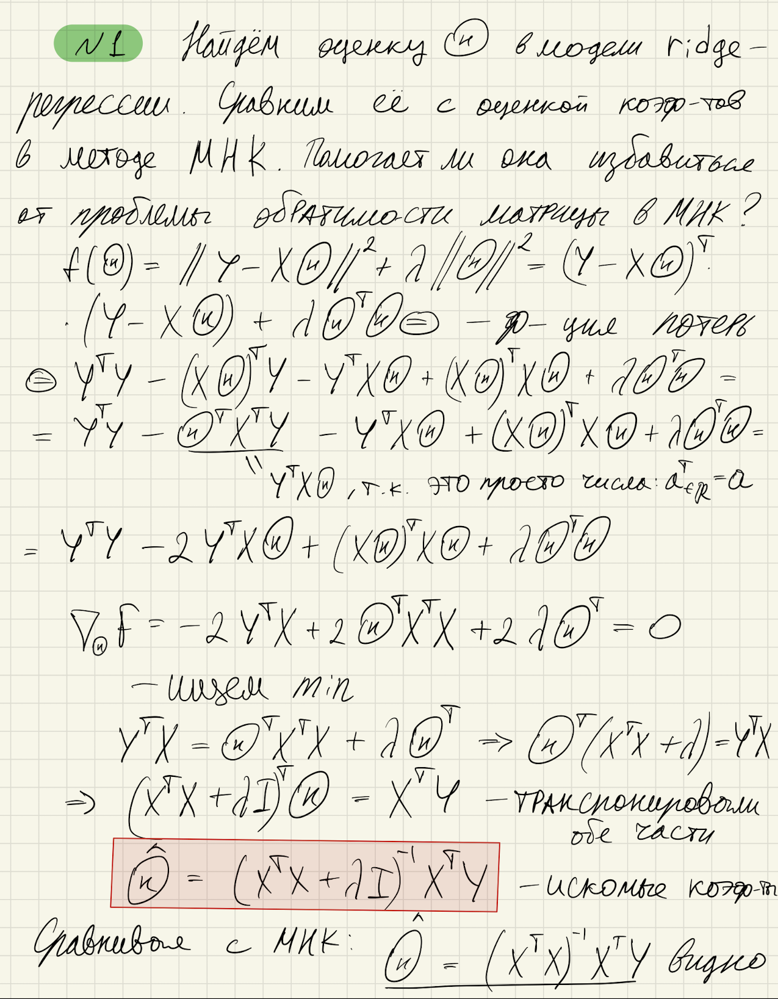

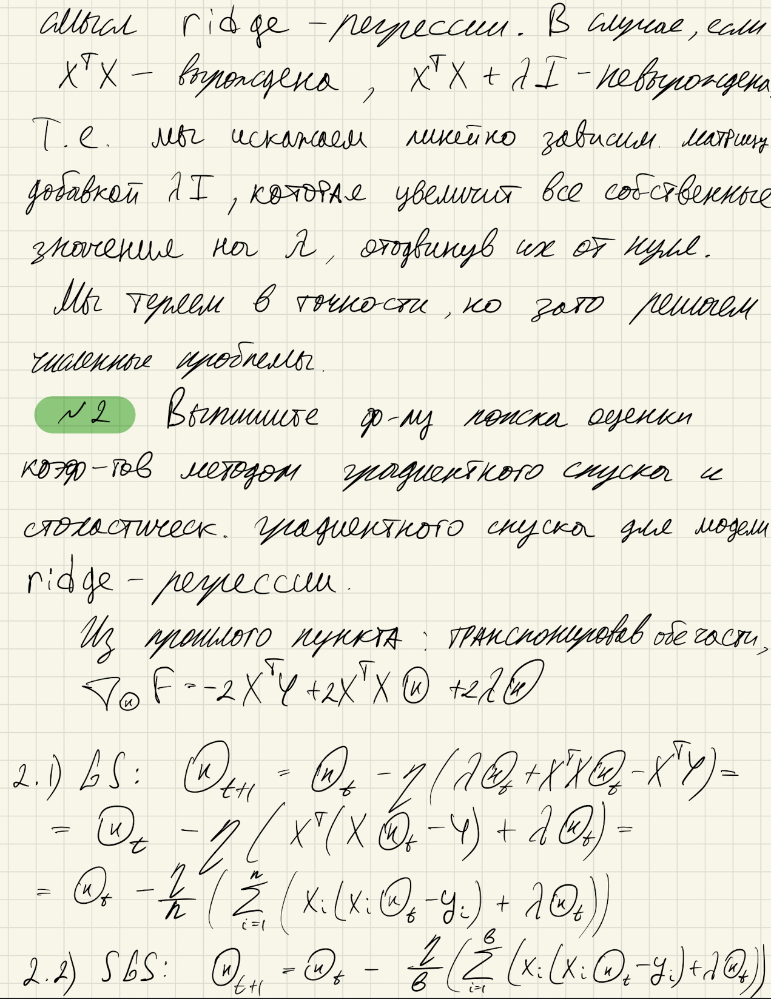

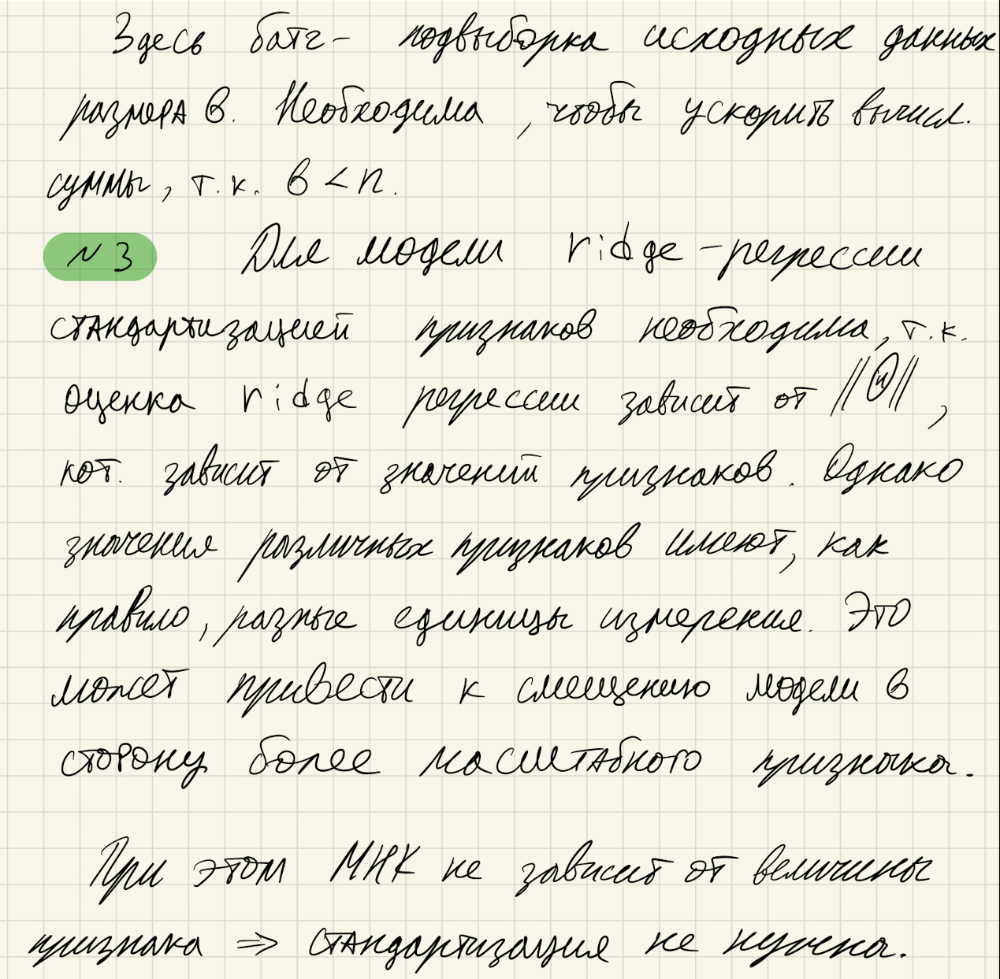

### Задача 4.

В данной задаче мы продолжим анализировать данные велопроката из задачи 2.

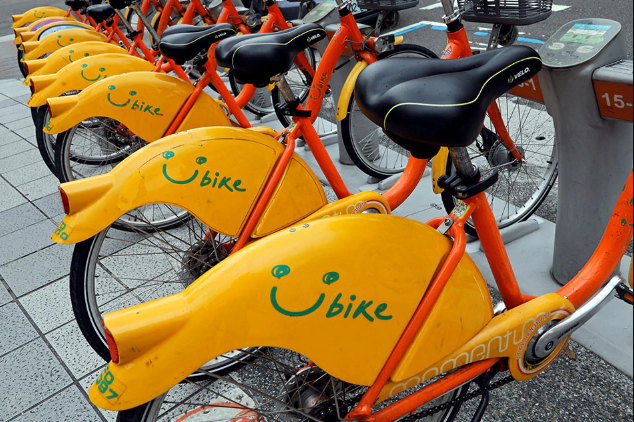

Для начала реализуйте класс для работы с моделью ridge-регрессии, используя явную формулу из предыдущей задачи. Интерфейс этого класса соответствует стандарту библиотеки `sklearn`, который использует также множество других библиотек.

In [26]:
class RidgeRegression:
    def __init__(self, lambd=0.1, fit_intercept=True):
        '''
        Инициализация модели.
        
        Аргументы:
        lambd -- параметр регуляризации.
        fit_intercept -- добавить ли константный признак.
        '''
        
        self.lambd = lambd
        self.fit_intercept = fit_intercept
    
    def fit(self, X, Y):
        '''
        Обучение модели ridge-регрессии.
        
        Аргументы:
        X -- numpy-матрица объект-признак размера (n, d);
        Y -- numpy-вектор значений целевого признака размера (n,).
        '''
        
        X = np.vstack(([np.hstack(([1.0], x)) for x in X]))
        Y = np.vstack(([y for y in Y]))
        
        tmp = np.transpose(X) @ X + self.lambd * np.identity(X.shape[1])
        self.coef_ = np.linalg.inv(tmp) @ np.transpose(X) @ Y
        
        return self

    def predict(self, X):
        '''
        Вычисление предсказаний.
        
        Аргументы:
        X -- numpy-матрица объект-признак размера (n, d);
        
        Возвращает:
        predictions -- предсказания в виде numpy-вектора размера (n,).
        '''
        predictions = self.coef_[0] * self.fit_intercept + self.coef_[1] * X
        return predictions 

Разделите данные на три части &mdash; обучающую, валидационную и тестовую в соотношении 3:1:1. На первой из них вам необходимо проводить всю аналитику и обучать все модели &mdash; регрессию, скалирование и т.д.. Вторую вы будете использовать для выбора оптимального значения гиперпараметра. Наконец, тестовую выборку необходимо использовать только для вычисления итогового значения метрик выбранной модели. Именно эти числа вам нужно говорить заказчику.

Подробнее посмотрите в <a href="https://miptstats.github.io/courses/ad_fivt/ML_pipeline.pdf">презентации</a> с занятия.

In [27]:
data_set = pd.read_csv('day.csv')
data_set = data_set[['season', 'mnth', 'holiday', 'weekday', 'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed', 'cnt']]

In [28]:
train, test = train_test_split(data_set, test_size=0.2, random_state=43)
train, validate = train_test_split(train, test_size=0.25, random_state=42)

Выполните необходимые преобразования признаков. Не забудьте, что <a href="https://miptstats.github.io/courses/ad_fivt/linreg_sklearn.html#2.-Обучение">обучить преобразования</a> нужно только по обучающей выборке. Учтите все особенности, которые обсуждались ранее в данном задании.

Выделяем типы признаков.

In [29]:
categorial_features = ['season', 'mnth', 'holiday', 'weekday', 'workingday', 'weathersit'] # категориальные признаки
real_features = ['temp', 'atemp', 'hum', 'windspeed'] # вещественные признаки
target_feature = 'cnt' # целевой признак

Убираем выбросы.

In [30]:
for col in real_features:
    emissions_left = train[col].quantile(0.01)
    emissions_right = train[col].quantile(0.99)
    train = train[(train[col] < emissions_right) & (train[col] > emissions_left)]
    
    emissions_left = test[col].quantile(0.01)
    emissions_right  = test[col].quantile(0.99)
    test = test[(test[col] < emissions_right) & (test[col] > emissions_left)]
    
    emissions_left = validate[col].quantile(0.01)
    emissions_right  = validate[col].quantile(0.99)
    validate = validate[(validate[col] < emissions_right) & (validate[col] > emissions_left)]
    
print("Размер обучающей выборки: ", train.shape)
print("Размер тестовой выборки: ", test.shape)
print("Размер валидационной выборки: ", validate.shape)

Размер обучающей выборки:  (398, 11)
Размер тестовой выборки:  (131, 11)
Размер валидационной выборки:  (130, 11)


Вводим класс для стандартизации признаков.

In [31]:
scaler = MinMaxScaler()

Кодируем и стандартизируем категориальные признаки для всех частей данных: тренировочных, тестовых и валидационных.

In [32]:
encoder = OneHotEncoder(drop='first', sparse=False)  # объявляем модель
train_cat = encoder.fit_transform(train[categorial_features])  # обучаем и кодируем
X_train = np.hstack([train[real_features], train_cat])
X_train = scaler.fit_transform(X_train)

In [33]:
test_cat = encoder.transform(test[categorial_features])
X_test = np.hstack([test[real_features], test_cat])
X_test = scaler.fit_transform(X_test)

In [34]:
validate_cat = encoder.transform(validate[categorial_features])
X_validate = np.hstack([validate[real_features], validate_cat])
X_validate = scaler.fit_transform(X_validate)

Обучаем модель

In [35]:
model = RidgeRegression(lambd=1)  # объявляем модель
model.fit(X_train, train[target_feature])  # обучаем

print("Полученные оценки коэффициентов: ")
for num in model.coef_:
    print(round(float(num), 3), end=" ")

print()
print("Свободный коэфффицент: ", round(model.fit_intercept, 3))

Полученные оценки коэффициентов: 
2748.316 1645.605 2536.54 -1992.585 -889.644 925.779 853.946 1462.877 201.1 353.405 112.137 59.579 -362.056 -362.046 -104.689 553.071 132.353 133.917 52.559 -488.073 -147.096 -165.438 42.296 102.998 60.77 493.163 381.604 -118.664 -1239.579 
Свободный коэфффицент:  1


Выполним предсказание построенной ранее моделью.

In [36]:
test_preds = model.predict(X_test)
test_preds = test_preds[:, 0]

Сперва воспользуемся метрикой RMSE.

In [37]:
metrics.mean_squared_error(test[target_feature], test_preds) ** 0.5

1974.2126764626103

Далее воспользуемся метрикой MAE.

In [38]:
metrics.mean_absolute_error(test[target_feature], test_preds)

1605.8772191975675

И наконец - метрикой MAPE.

In [39]:
def mean_absolute_percentage_error(y_true, y_pred):
    return 100 * (np.abs(y_true - y_pred) / y_true).mean()

In [40]:
print("ошибка в процентах: ", mean_absolute_percentage_error(test[target_feature], test_preds))

ошибка в процентах:  38.250089478436635


Определите сетку значений гиперпараметра $\lambda$ и обучите для каждого значения сетки модель ridge-регрессии. Обычно эффективнее брать сетку в логарифмическом масштабе, воспользовавшись `np.logspace`.

In [41]:
models = []

quality_train = {}
quality_validate = {}
quality_train['RMSE'] = []
quality_train['MAE'] = []
quality_train['MAPE'] = []
quality_validate['RMSE'] = []
quality_validate['MAE'] = []
quality_validate['MAPE'] = []

for lambda1 in np.logspace(-10, 10, base=2):
    model = RidgeRegression(lambd=lambda1)
    model.fit(X_train, train[target_feature])
    models.append(model)
    
    validate_res = model.predict(X_validate)
    validate_res = validate_res[:, 0]
    
    train_res = model.predict(X_train)
    train_res = train_res[:, 0]
    
    quality_validate['RMSE'].append(metrics.mean_squared_error(validate[target_feature], validate_res) ** 0.5)
    quality_validate['MAE'].append(metrics.mean_absolute_error(validate[target_feature], validate_res))
    quality_validate['MAPE'].append(mean_absolute_percentage_error(validate[target_feature], validate_res))

Для каждой из них посчитайте ошибку по метрикам RMSE, MAE, MAPE по обучающей и валидационной выборкам. Подробнее можно почитать в <a href="https://miptstats.github.io/courses/ad_fivt/linreg_sklearn.html#3.-Тестирование-и-оценка-качества">ноутбуке</a> с занятия.

In [42]:
print('Min ошибка RMSE на validate:', np.min(quality_validate['RMSE']))
print('Min ошибка MAE на validate:', np.min(quality_validate['MAE']))
print('Min ошибка MAPE на validate:', np.min(quality_validate['MAPE']))

Min ошибка RMSE на validate: 2030.6025796004296
Min ошибка MAE на validate: 1681.2465743670002
Min ошибка MAPE на validate: 39.88669216429465


Для каждой метрики постройте графики зависимости значений метрики от значения гиперпараметра. Сравните поведение значений метрик для обучающей и валидационной выборок.

In [50]:
def metric(metric_name):
    plt.figure(figsize=(15, 6), dpi=80)
    x_plt = np.logspace(-10, 10, base=2)

    plt.plot(x_plt, quality_validate[metric_name])

    plt.ylabel(metric_name);
    plt.xlabel("Значение гиперпараметра");
    plt.title("Зависимость метрики от гиперпараметра");
    plt.locator_params(axis='x', nbins=40)
    plt.xlim((-0.1, 10))

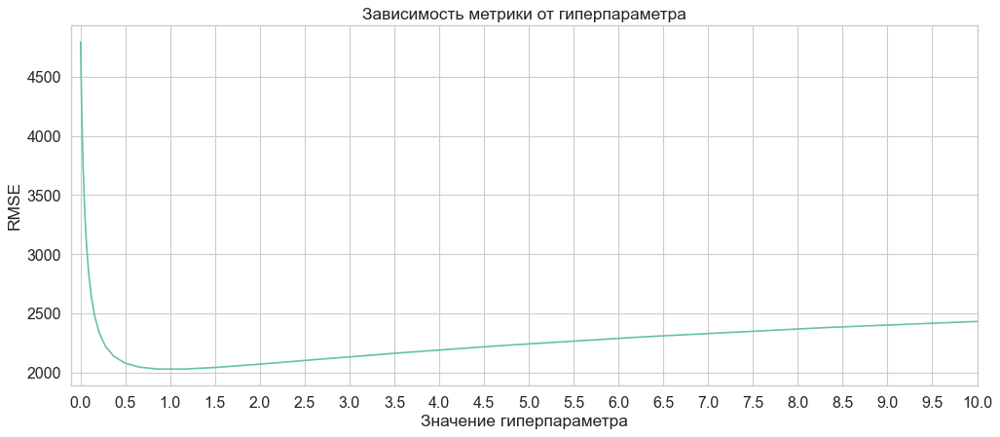

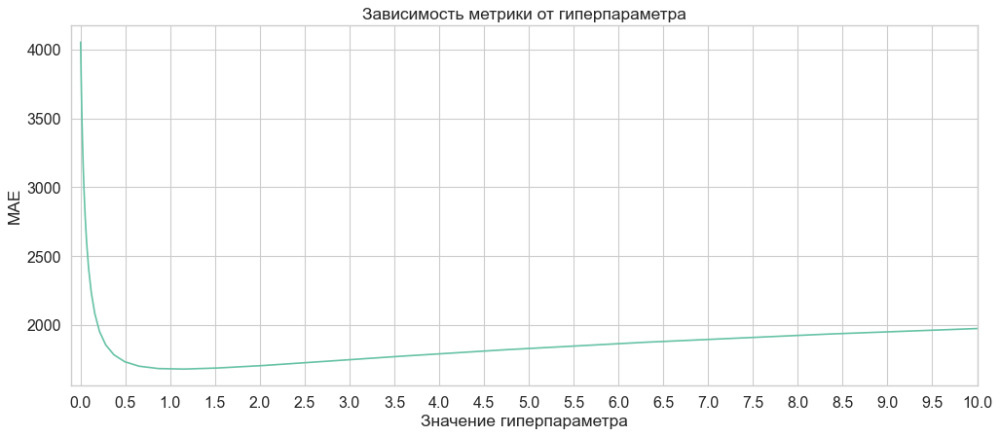

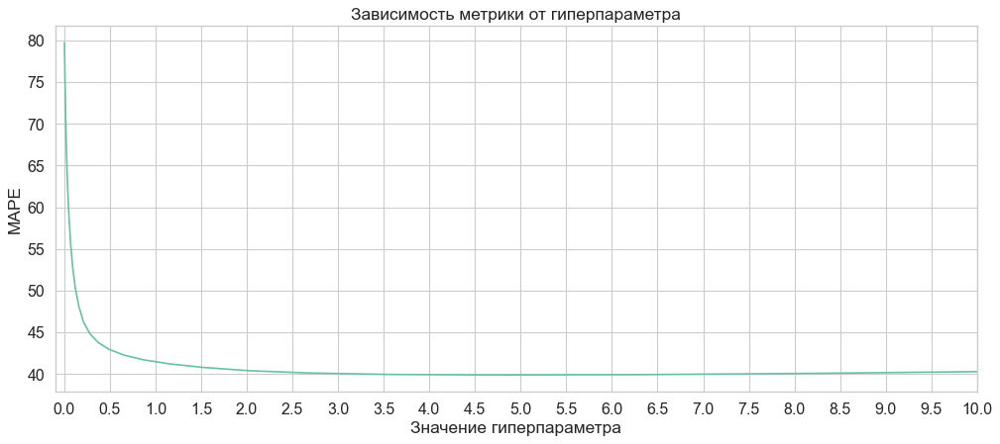

In [51]:
metric('RMSE')
metric('MAE')
metric('MAPE')

Постройте также на одном графике кривые зависимости значений оценок коэффициентов от значений гиперпараметра. Какая наблюдается зависимость? Как вы это можете охарактеризовать?

*Замечание*. Возможно, будет информативнее рисовать графики в логарифмическом масштабе. Для наглядности можно также попробовать рисовать одним цветом все кривые, которые относятся к одному *исходному* признаку.

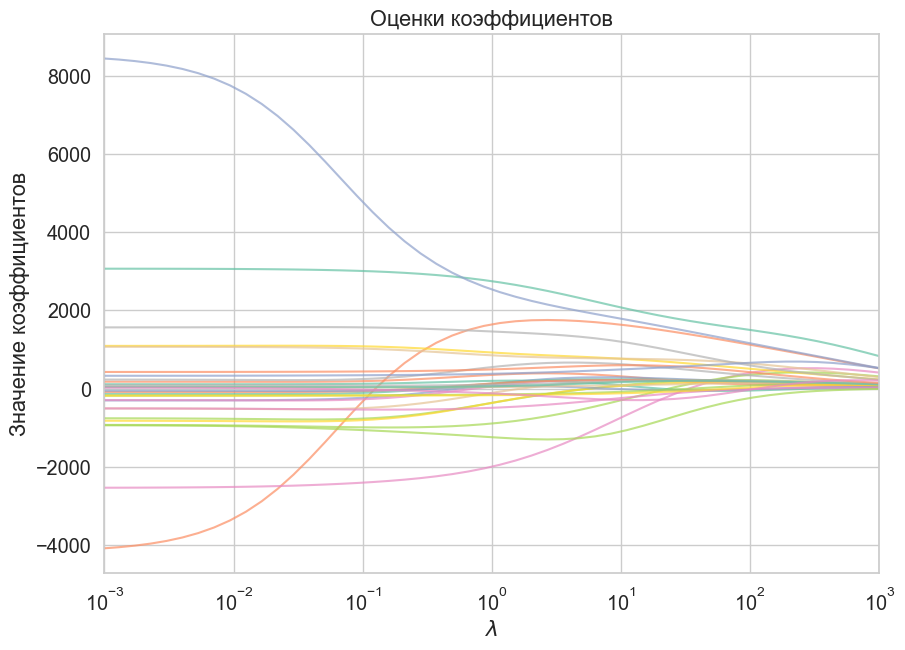

In [52]:
coefs = []
for model in models:
    coefs.append(model.coef_)
coefs = np.array(coefs).T
plt.figure(figsize=(10, 7))
for i in range(len(coefs[0])):
    plt.plot(np.logspace(-10, 10, base=2), 
              coefs[0][i], 
              alpha=0.7)
    
plt.title('Оценки коэффициентов')
plt.ylabel('Значение коэффициентов')
plt.xlabel('$\lambda$')

plt.xlim((1e-3, 1e3))
plt.xscale('log')

Выберите оптимальное значение гиперпараметра и посчитайте ошибку на тестовой выборке.

Как видим из графиков оптимальное значение гиперпараметра можно смело брать за $\lambda$ = 1 для повышения качества модели.

Теперь посмотрим на качество финально в тестовой выборке.

In [53]:
model = RidgeRegression(lambd=1)
model.fit(X_train, train[target_feature])

res = model.predict(X_test)
print('RMSE:', metrics.mean_squared_error(test[target_feature], res[:, 0]) ** 0.5)
print('MAE:', metrics.mean_absolute_error(test[target_feature], res[:, 0]))
print('MAPE:', mean_absolute_percentage_error(test[target_feature], res[:, 0]))

RMSE: 1974.2126764626103
MAE: 1605.8772191975675
MAPE: 38.250089478436635


Сделайте выводы.

Таким образом, мы подобрали оптимальное для данной модели значение гиперпараметра $\lambda$ = 1. Именно этот параметр является ключевым в Ridge регрессии, которая помогает бороться с зависимыми признаками. 

При этом посмотрев на график оценки коэффицентов мы может понять, что при маленьких значениях $\lambda$ какие-то признаки очень сильно влияют друг предсказания, а при больших значениях $\lambda$ все признаки становятся равнозначными. Обе эти крайности плохо влияют на качество модели, поэтому нужно искать баланс между коэффицентами. В нашем случае это $\lambda$ = 1.

### Задача 5.

Предположим, что имеющиеся у нас данные по велопрокату &mdash; большие данные. Конечно же в реальности это не так. Однако, для простой учебной задачи это в самый раз, чтобы ничего ни у кого не подвисало.

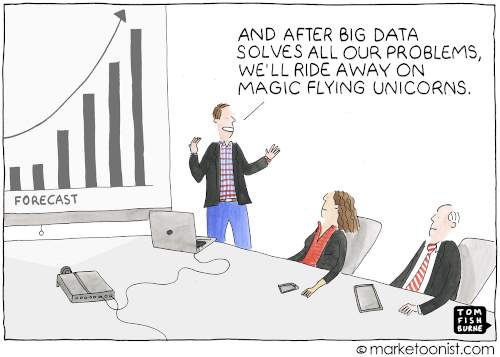

Выберите некоторое начальное приближение оценок коэффициентов, например, в начале координат.

In [54]:
approximation = 0.00015

Реализуйте процедуру стохастического градиентного спуска для поиска оценок коэффициентов в модели ridge-регрессии. Размер батча (набор объектов на каждой итерации) обычно берут кратно степени двойки, например, 128 или 256. Значение $\lambda$ можно взять из предыдущей задачи.

In [55]:
def batch(theta, X, Y, nu=approximation, lambd=1, batch=128):
    index = np.random.choice(np.arange(X.shape[0]), size=batch)
    
    X_batch = X[index]
    Y_batch = Y[index]
    
    return theta - nu * ((theta.T @ X_batch.T - Y_batch.T) @ X_batch + lambd * theta)

def predict(theta, X):
    X = np.hstack((np.ones(shape=(X.shape[0], 1)), X))
    return theta @ X.T

Нарисуйте графики зависимости значений метрик RMSE, MAE, MAPE от номера итерации для обучающей и валидационной выборок. Сколько итераций пришлось совершить?

In [56]:
amount_features = 11

quality_validate = {}
quality_validate['RMSE'] = []
quality_validate['MAE'] = []
quality_validate['MAPE'] = []

X = np.hstack((np.ones(shape=(X_train.shape[0], 1)), X_train))
theta = np.zeros(X_train.shape[1] + 1)

max_count_steps = 5000
for i in range(max_count_steps):
    validate_predict = predict(theta, X_validate)
    theta = batch(theta, X, train[target_feature].to_numpy())
    
    quality_validate['RMSE'].append(metrics.mean_squared_error(validate[target_feature], validate_predict) ** 0.5)
    quality_validate['MAE'].append(metrics.mean_absolute_error(validate[target_feature], validate_predict))
    quality_validate['MAPE'].append(mean_absolute_percentage_error(validate[target_feature], validate_predict))

In [59]:
def metric(metric_name):
    plt.figure(figsize=(14, 7), dpi=85)
    x_plt = np.arange(0, max_count_steps)


    plt.plot(x_plt, quality_validate[metric_name])

    plt.ylabel(metric_name);
    plt.xlabel("Количество шагов")
    plt.title("Зависимость качества от количества шагов")

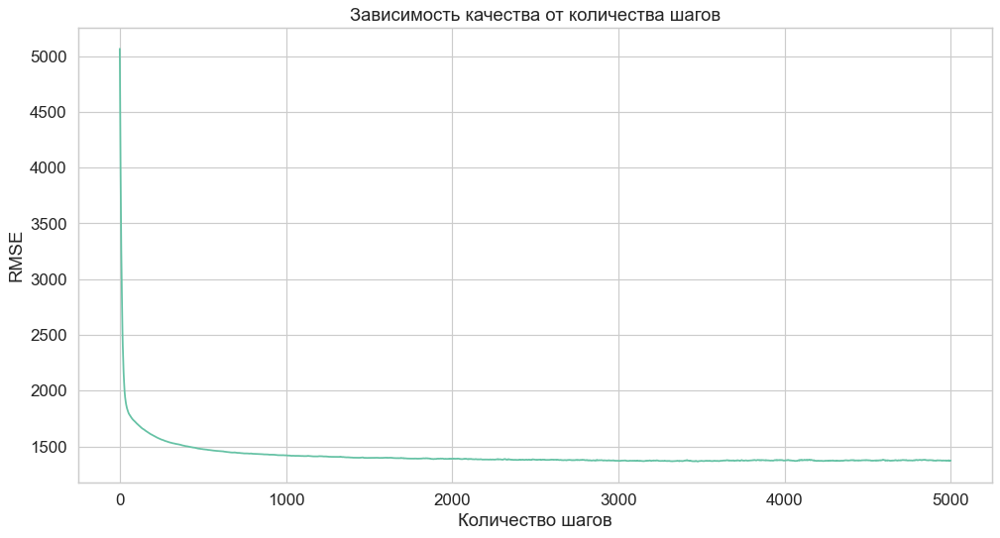

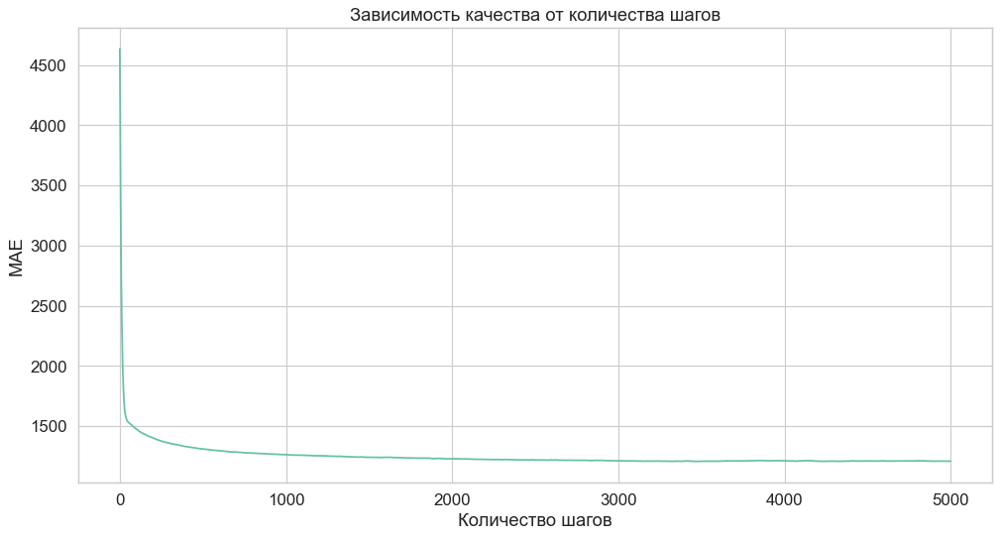

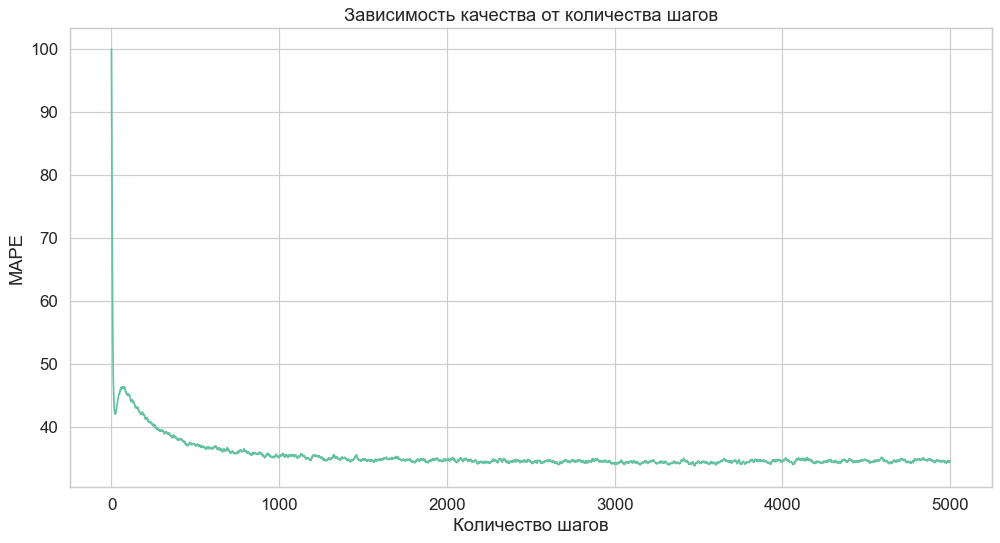

In [60]:
metric('RMSE')
metric('MAE')
metric('MAPE')

Посчитайте ошибку на тестовой выборке.

In [61]:
print('RMSE:', metrics.mean_squared_error(test[target_feature], predict(theta, X_test)) ** 0.5)
print('MAE:', metrics.mean_absolute_error(test[target_feature], predict(theta, X_test)))
print('MAPE:', mean_absolute_percentage_error(test[target_feature], predict(theta, X_test)))

RMSE: 1242.7265369603363
MAE: 1056.407162922364
MAPE: 28.947657842829965


Сделайте выводы.

Таким образом, мы использовали Ridge регрессию и стахостический градиентный спуск вместе, в результате которого получили довольно высокую точность 29%. Главные выигрыш данной комбинации: Ridge регрессии и стахостического градиентного спуска - это быстрая работа с большими обьёмами данных, за счёт самой специфики градиентного спуска. При этом сделав еще больше шагов спуска мы можем улучшить качество модели и таким образом регулировать её.